This notebook plot figure for HGDP

In [ ]:
import os
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import KMeans
import phate
import umap
import scprep
project_root = os.path.abspath(os.path.join(os.getcwd(), ".."))
# Add src directory to the Python path
sys.path.append(os.path.join(project_root, "src"))
from HGDP_utils import load_data_HGDP
from dm import DiffusionMap

In [120]:
# define paths
DATA_PATH = "/home/mila/s/shuang.ni/scratch/phate_genetics/data/HGDP+1KGP/V4"
SAVE_PATH = "/home/mila/s/shuang.ni/scratch/phate_genetics/results/HGDP+1KGP"
Figure_PATH = SAVE_PATH + "/figures"
os.makedirs(Figure_PATH, exist_ok=True)

In [121]:
metadata, relatedness, data, mapping_info = load_data_HGDP(DATA_PATH)
cmap_genetic_region, cmap_pop= mapping_info

In [122]:
# filter data
filters = ["filter_pca_outlier", "hard_filtered", "filter_contaminated"]
_filtered_indices = metadata[metadata[filters].any(axis=1)].index
filtered_indices = ~metadata.index.isin(_filtered_indices)
data = data[filtered_indices]
metadata = metadata[filtered_indices]
# get filterted lables
label_genetic_region = metadata['Genetic_region_merged'].values
label_pop = metadata['Population'].values

# filter related samples
related_indices = ~metadata['filter_king_related'].values

to_fit_on = related_indices
to_transform_on = ~related_indices

# fit PCA on unrelated samples and transform on related samples

In [ ]:
pca_obj = sklearn.decomposition.PCA(n_components=50, random_state=42)
pca_obj.fit(data[to_fit_on])
inputs = pca_obj.transform(data)

In [25]:
# save PCA 50D in txt
np.savetxt(SAVE_PATH + "/PCA_50D.txt", inputs)

In [123]:
# load PCA 50D
inputs = np.loadtxt(SAVE_PATH + "/PCA_50D.txt")

# run all methods

## PHATE

In [179]:
phate_op_2d = phate.PHATE(random_state=42, 
                          n_components=2, 
                          knn=80, 
                          t=6, 
                          decay=60,
                          n_pca=None)
phate_op_2d.fit(inputs)
phate_emb_2d = phate_op_2d.transform()

Running PHATE on 4094 observations and 50 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 1.04 seconds.
  Calculating affinities...
  Calculated affinities in 0.12 seconds.
Calculated graph and diffusion operator in 1.19 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 0.56 seconds.
  Calculating KMeans...
  Calculated KMeans in 2.85 seconds.
Calculated landmark operator in 4.17 seconds.
Calculating diffusion potential...
Calculated diffusion potential in 0.18 seconds.
Calculating metric MDS...
Calculated metric MDS in 4.16 seconds.


In [130]:
# save PHATE 2D in txt
np.savetxt(SAVE_PATH + "/PHATE_2D.txt", phate_emb_2d)

<Axes: title={'center': 'PHATE'}, xlabel=' ', ylabel=' '>

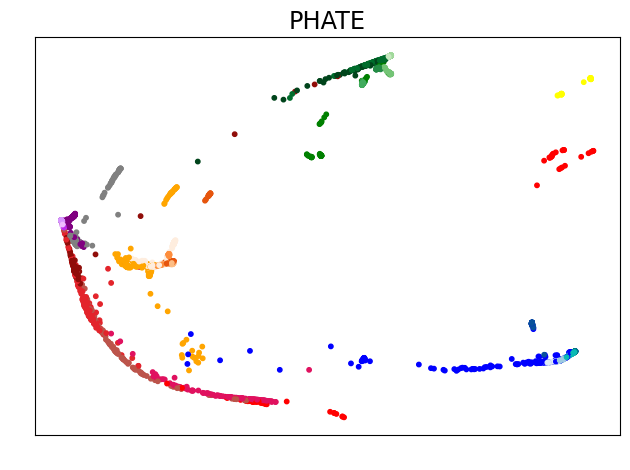

In [178]:
scprep.plot.scatter2d(phate_emb_2d, s=10, 
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='PHATE', fontsize=10)

## UMAP

In [12]:
umap_op_2d = umap.UMAP(n_components=2, n_neighbors=6, min_dist=0.6, random_state=42)
umap_emb_2d = umap_op_2d.fit_transform(inputs)

/home/mila/s/shuang.ni/manifold_genetics/.venv/lib/python3.9/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/mila/s/shuang.ni/manifold_genetics/.venv/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


In [14]:
# save UMAP 2D in txt
np.savetxt(SAVE_PATH + "/UMAP_2D.txt", umap_emb_2d)

<Axes: title={'center': 'UMAP'}, xlabel=' ', ylabel=' '>

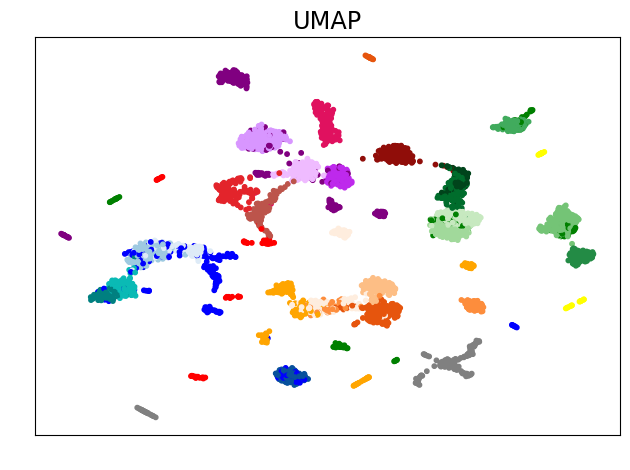

In [34]:
scprep.plot.scatter2d(umap_emb_2d, s=10, 
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='UMAP', fontsize=10)

## t-SNE

In [15]:
tsne_op_2d = TSNE(n_components=2, perplexity=20, n_iter=1000, random_state=42)
tsne_emb_2d = tsne_op_2d.fit_transform(inputs)

In [16]:
# save tSNE 2D in txt
np.savetxt(SAVE_PATH + "/tSNE_2D.txt", tsne_emb_2d)

## diffusion map

In [ ]:
# diffusion map embeddings
dm_obj = DiffusionMap(n_components=2, knn=120, t=10)
dm_obj.fit(inputs)
diffusion_emb_2d = dm_obj.transform(inputs)

In [ ]:
# save tSNE 2D in txt
np.savetxt(SAVE_PATH + "/diffusion_2D.txt", tsne_emb_2d)

# repulsion PHATE

In [ ]:
#repulsion PHATE

# load embeddings from saved

In [ ]:
# load embeddings from txt
inputs = np.loadtxt(SAVE_PATH + "/PCA_50D.txt")
phate_emb_2d = np.loadtxt(SAVE_PATH + "/PHATE_2D.txt")
umap_emb_2d = np.loadtxt(SAVE_PATH + "/UMAP_2D.txt")
tsne_emb_2d = np.loadtxt(SAVE_PATH + "/tSNE_2D.txt")
diffusion_emb_2d = np.loadtxt(SAVE_PATH + "/PHATE_2D.txt")
repulsion_emb_2d = np.loadtxt(SAVE_PATH + "/PHATE_2D.txt")


# plot populations

## plot 4 methods

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


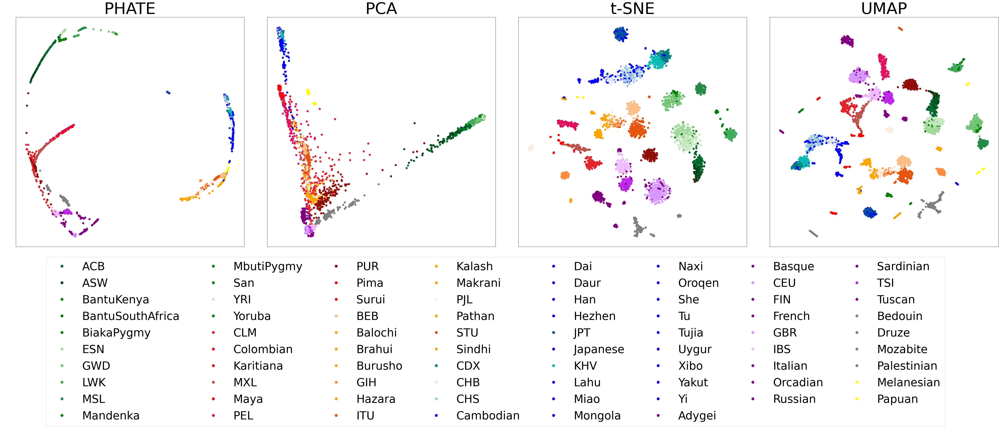

In [132]:
fig, axes = plt.subplots(1,4, figsize=(68, 16), gridspec_kw={'width_ratios': [1, 1, 1, 1], 'wspace': 0.1})

# PHATE
scprep.plot.scatter2d(phate_emb_2d, s=50, ax=axes[0],
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None,title='PHATE', fontsize=36)

# PCA
scprep.plot.scatter2d(inputs[:,:2], s=50, ax=axes[1],
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=True,xlabel=' ', ylabel=' ',
                      legend_loc='upper center', legend_anchor=(1.0, -0.02), legend_ncol=8,
                      label_prefix=None, title='PCA', fontsize=36)

# t-SNE
scprep.plot.scatter2d(tsne_emb_2d, s=50, ax=axes[2],
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='t-SNE', fontsize=36)
# UMAP
scprep.plot.scatter2d(umap_emb_2d, s=50, ax=axes[3],
                      cmap=cmap_pop, c=label_pop,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='UMAP', fontsize=36)


plt.savefig(Figure_PATH+'/HGDP_pop_4methods.png', format='png', bbox_inches='tight', dpi=300)
plt.savefig(Figure_PATH+'/HGDP_pop_4methods.eps', format='eps', bbox_inches='tight', dpi=300)
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


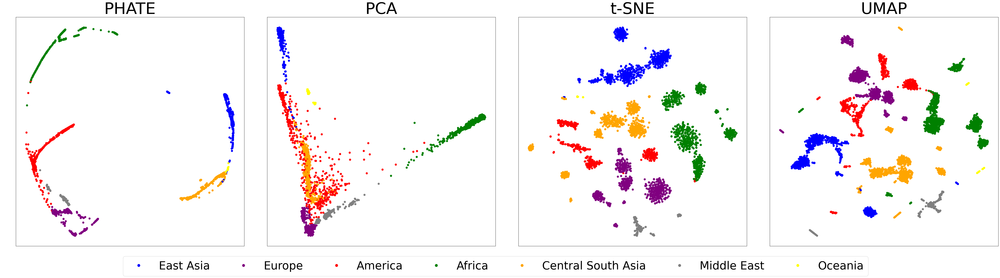

In [133]:
fig, axes = plt.subplots(1,4, figsize=(68, 16), gridspec_kw={'width_ratios': [1, 1, 1, 1], 'wspace': 0.1})

# PHATE
scprep.plot.scatter2d(phate_emb_2d, s=50, ax=axes[0],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None,title='PHATE', fontsize=36)

# PCA
scprep.plot.scatter2d(inputs[:,:2], s=50, ax=axes[1],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=True,xlabel=' ', ylabel=' ',
                      legend_loc='upper center', legend_anchor=(1.0, -0.02), legend_ncol=8,
                      label_prefix=None, title='PCA', fontsize=36)

# t-SNE
scprep.plot.scatter2d(tsne_emb_2d, s=50, ax=axes[2],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='t-SNE', fontsize=36)
# UMAP
scprep.plot.scatter2d(umap_emb_2d, s=50, ax=axes[3],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='UMAP', fontsize=36)


plt.savefig(Figure_PATH+'/HGDP_genetic_region_4methods.png', format='png', bbox_inches='tight', dpi=300)
plt.savefig(Figure_PATH+'/HGDP_genetic_region_4methods.eps', format='eps', bbox_inches='tight', dpi=300)
plt.show()

## plot 6 methods


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


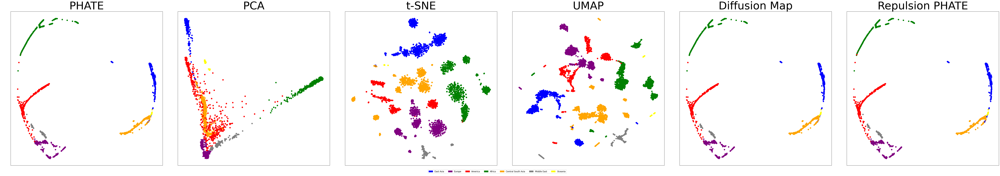

In [ ]:
import matplotlib.patches as mpatches
n_methods = 6
fig, axes = plt.subplots(1,n_methods, figsize=(17*n_methods, 16), gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1], 'wspace': 0.1})

# PHATE
scprep.plot.scatter2d(phate_emb_2d, s=50, ax=axes[0],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None,title='PHATE', fontsize=36)

# PCA
scprep.plot.scatter2d(inputs[:,:2], s=50, ax=axes[1],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False, xlabel=' ', ylabel=' ',
                      label_prefix=None,title='PCA', fontsize=36)

# t-SNE
scprep.plot.scatter2d(tsne_emb_2d, s=50, ax=axes[2],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=True,xlabel=' ', ylabel=' ',
                      legend_loc='upper center', legend_anchor=(1.0, -0.02), legend_ncol=8,
                      label_prefix=None, title='t-SNE', fontsize=36)

# UMAP
scprep.plot.scatter2d(umap_emb_2d, s=50, ax=axes[3],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='UMAP', fontsize=36)

# diffusion map
scprep.plot.scatter2d(diffusion_emb_2d, s=50, ax=axes[4],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='Diffusion Map', fontsize=36)

# Repulsion PHATE
scprep.plot.scatter2d(repulsion_emb_2d, s=50, ax=axes[5],
                      cmap=cmap_genetic_region, c=label_genetic_region,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title='Repulsion PHATE', fontsize=36)

plt.savefig(Figure_PATH+'/HGDP_genetic_region_6methods.png', format='png', bbox_inches='tight', dpi=300)
# plt.savefig(Figure_PATH+'/HGDP_genetic_region_6methods.eps', format='eps', bbox_inches='tight', dpi=300)
plt.show()

# plot Admixture

In [134]:
# load admixture
admix_ratios = pd.read_csv(DATA_PATH + "/admixture/ADMIXTURE_HGDP+1KGP/global.5_metadata.tsv", sep='\t', index_col=0, header=None)
admix_ratios = admix_ratios.reset_index()
# remove last two columns
admix_ratios = admix_ratios.drop(admix_ratios.columns[-2:], axis=1)

In [135]:
metadata_row_names = metadata.index.tolist()    
# Extract row names from admix_ratios (column 0)
admix_row_names = admix_ratios.iloc[:, 0].tolist()
# Check if they are identical
is_identical = metadata_row_names == admix_row_names
print("Are the row names in the same order?", is_identical)


Are the row names in the same order? True


In [136]:
admix_ratios = admix_ratios.drop(admix_ratios.columns[:1], axis=1)
# assign collumn names
admix_ratios.columns = ['African Ancestry (%)', 'Amerindigenous Ancestry (%)', 'European Ancestry (%)', 'East Asian Ancestry (%)', 'Central South Asian Ancestry (%)']

In [137]:
# plot admixture function
def plot_admixture(embedding, admix_ratios, ax, label_prefix = None):
    for col, score_name in enumerate(admix_ratios.columns):
        if col == 0:
            scatter_admix = scprep.plot.scatter2d(embedding, 
                                                  s=40, ax=ax[col],
                                                  c=admix_ratios[score_name], 
                                                  xticks=False, 
                                                  yticks=False, 
                                                  legend=False,
                                                  label_prefix=label_prefix, 
                                                  xlabel=' ', ylabel=label_prefix,
                                                  fontsize=36, 
                                                  cmap='seismic')
        else:
            scatter_admix = scprep.plot.scatter2d(embedding, 
                                                s=40, ax=ax[col],
                                                c=admix_ratios[score_name], 
                                                xticks=False, 
                                                yticks=False, 
                                                legend=False,
                                                xlabel=' ', ylabel=' ',
                                                fontsize=36, 
                                                cmap='seismic')
    return scatter_admix



## 4 methods

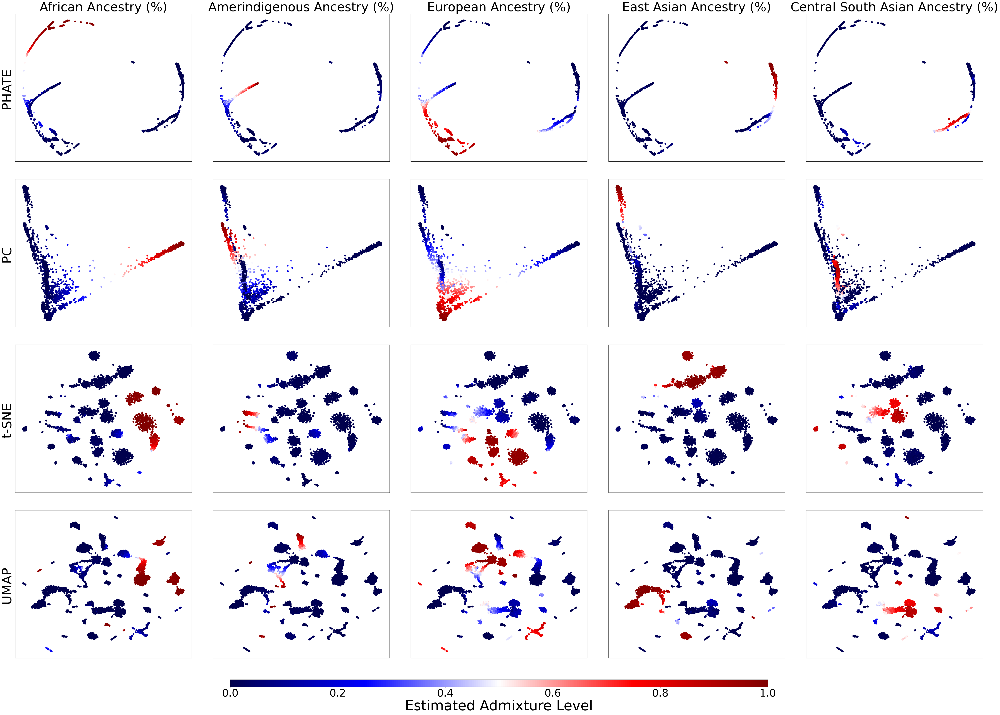

In [142]:
ncols = 5
nrows = 4
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*12,nrows*10), gridspec_kw={'wspace': 0.12, 'hspace': 0.12})
scatter_admix = plot_admixture(phate_emb_2d, admix_ratios, ax[0], label_prefix='PHATE ')
scatter_admix= plot_admixture(inputs[:,:2], admix_ratios, ax[1], label_prefix='PC ')
scatter_admix= plot_admixture(tsne_emb_2d, admix_ratios, ax[2], label_prefix='t-SNE ')
scatter_admix = plot_admixture(umap_emb_2d, admix_ratios, ax[3], label_prefix='UMAP ')


for i, score_name in enumerate(admix_ratios.columns):
    ax[0][i].set_title(score_name, fontsize=50)

# Add colorbar
cbar_ax = fig.add_axes([0.25, 0.01, 0.5, 0.01])  # x-position (left margin), y-position (bottom margin), width, height
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.seismic), cax=cbar_ax, orientation='horizontal', fraction=0.02)
cbar.set_label('Estimated Admixture Level', fontsize=56)
cbar.ax.tick_params(labelsize=42)  

# Manually adjust the layout
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)

plt.savefig(Figure_PATH+'/HGDP_5admixtures_4methods.png', format='png', bbox_inches='tight', dpi = 300)
plt.savefig(Figure_PATH+'/HGDP_5admixtures_4methods.eps', format='eps', bbox_inches='tight', dpi = 300)

## 6 methods

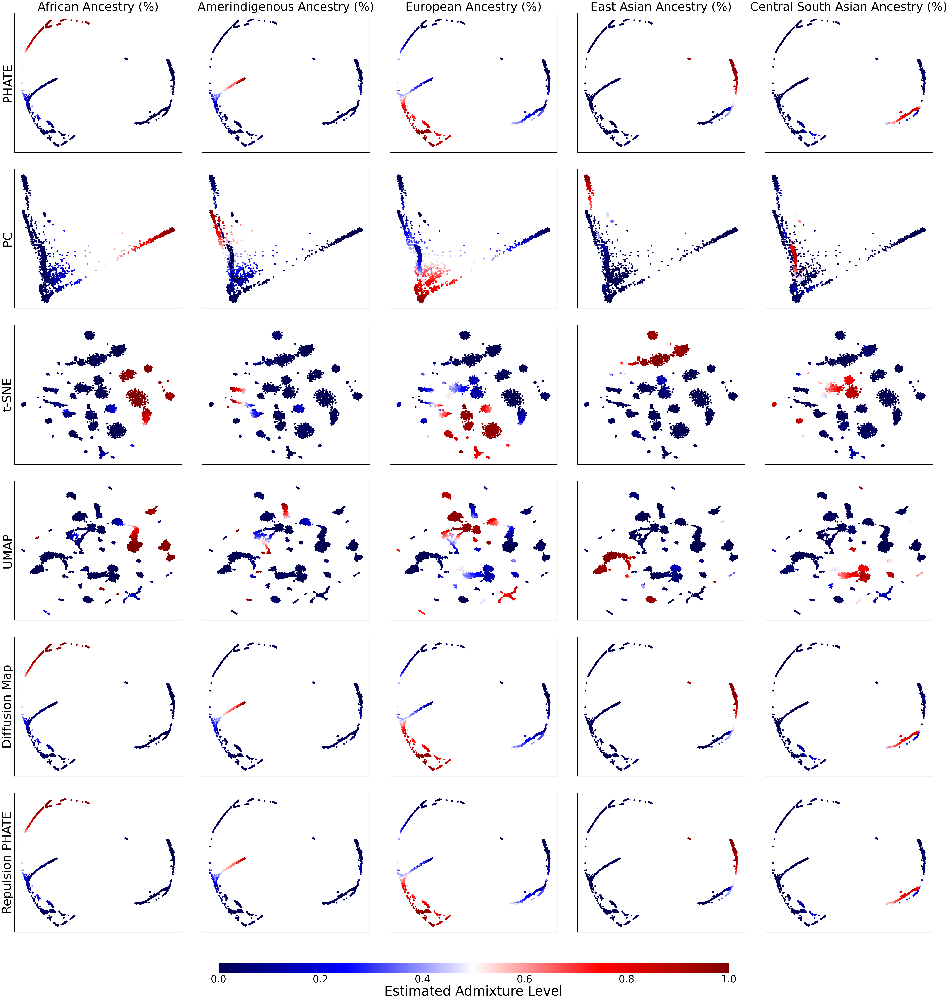

In [144]:
ncols = 5
nrows = 6
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*12,nrows*10), gridspec_kw={'wspace': 0.12, 'hspace': 0.12})
scatter_admix = plot_admixture(phate_emb_2d, admix_ratios, ax[0], label_prefix='PHATE')
scatter_admix= plot_admixture(inputs[:,:2], admix_ratios, ax[1], label_prefix='PC')
scatter_admix= plot_admixture(tsne_emb_2d, admix_ratios, ax[2], label_prefix='t-SNE')
scatter_admix = plot_admixture(umap_emb_2d, admix_ratios, ax[3], label_prefix='UMAP')
scatter_admix = plot_admixture(diffusion_emb_2d, admix_ratios, ax[4], label_prefix='Diffusion Map')
scatter_admix = plot_admixture(repulsion_emb_2d, admix_ratios, ax[5], label_prefix='Repulsion PHATE')


for i, score_name in enumerate(admix_ratios.columns):
    ax[0][i].set_title(score_name, fontsize=50)

# Add colorbar
cbar_ax = fig.add_axes([0.25, 0.01, 0.5, 0.01])  # x-position (left margin), y-position (bottom margin), width, height
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.seismic), cax=cbar_ax, orientation='horizontal', fraction=0.02)
cbar.set_label('Estimated Admixture Level', fontsize=56)
cbar.ax.tick_params(labelsize=42)  

# Manually adjust the layout
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)

plt.savefig(Figure_PATH+'/HGDP_5admixtures_6methods.png', format='png', bbox_inches='tight', dpi = 300)
plt.savefig(Figure_PATH+'/HGDP_5admixtures_6methods.eps', format='eps', bbox_inches='tight', dpi = 300)

## Amerindigenous admixture only, 6 methods

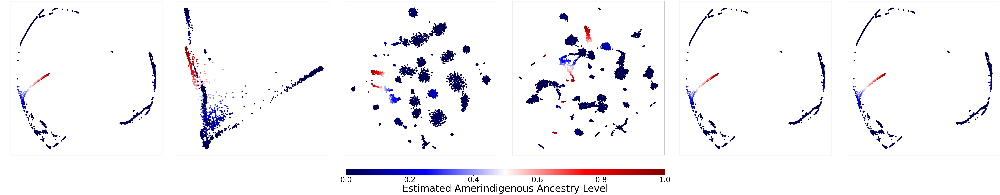

In [158]:
admix = admix_ratios['Amerindigenous Ancestry (%)']
n_methods = 6
fig, axes = plt.subplots(1,n_methods, figsize=(17*n_methods, 16), gridspec_kw={'width_ratios': [1, 1, 1, 1, 1, 1], 'wspace': 0.1})

# PHATE
scprep.plot.scatter2d(phate_emb_2d, s=50, ax=axes[0],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None,title=None, fontsize=36)

# PCA
scprep.plot.scatter2d(inputs[:,:2], s=50, ax=axes[1],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False, xlabel=' ', ylabel=' ',
                      label_prefix=None,title=None, fontsize=36)

# t-SNE
scprep.plot.scatter2d(tsne_emb_2d, s=50, ax=axes[2],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False, xlabel=' ', ylabel=' ',
                      label_prefix=None,title=None, fontsize=36)
# UMAP
scprep.plot.scatter2d(umap_emb_2d, s=50, ax=axes[3],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title=None, fontsize=36)

# diffusion map
scprep.plot.scatter2d(diffusion_emb_2d, s=50, ax=axes[4],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title=None, fontsize=36)

# Repulsion PHATE
scprep.plot.scatter2d(repulsion_emb_2d, s=50, ax=axes[5],
                      cmap='seismic', c=admix,
                      ticks =False, legend=False,xlabel=' ', ylabel=' ',
                      label_prefix=None, title=None, fontsize=36)

# Add colorbar
cbar_ax = fig.add_axes([0.388, 0.01, 0.25, 0.03])  # x-position (left margin), y-position (bottom margin), width, height
cbar = fig.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.seismic), cax=cbar_ax, orientation='horizontal', fraction=0.02)
cbar.set_label('Estimated Amerindigenous Ancestry Level', fontsize=56)
cbar.ax.tick_params(labelsize=42)  

plt.savefig(Figure_PATH+'/HGDP_amer_admix_6methods.png', format='png', bbox_inches='tight', dpi=300)
plt.savefig(Figure_PATH+'/HGDP_amer_admix_6methods.eps', format='eps', bbox_inches='tight', dpi=300)
plt.show()

# plot confusion matrix

## 10D embeddings for all methods

## HDBSCAN

In [ ]:
def make_confusion_matrix(clusterer, ax, colorbar=True):
    df = pd.DataFrame(columns=['HDBSCAN Cluster', 'Population'])
    df['HDBSCAN Cluster'] = clusterer.labels_
    df['Population'] = label_pop

    # Filter out the -1 cluster (unclustered data)
    df = df[df['HDBSCAN Cluster'] != -1]
    # Create a cross-tabulation of clusters and populations
    crosstab = pd.crosstab(df['HDBSCAN Cluster'], df['Population'])
    # Convert counts to proportions
    proportions = crosstab.div(crosstab.sum(axis=1), axis=0)

    # Reorder the populations to match the clusters
    ordered_populations = proportions.idxmax().sort_values().index
    proportions = proportions[ordered_populations]


    heatmap = sns.heatmap(proportions, cmap='viridis', annot=False,linewidths=0.05, linecolor='purple', 
                            cbar=colorbar if colorbar else None, cbar_kws={'shrink': 0.8} if colorbar else None, ax=ax)
    heatmap.invert_yaxis()
    ax.set_xlabel('Population')
    ax.set_ylabel('HDBSCAN Cluster')
    heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90, fontsize=14)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), fontsize=12)

    # Adjust the color bar tick labels font size
    if colorbar:
        cbar = heatmap.collections[0].colorbar
        cbar.ax.tick_params(labelsize=12)
    return heatmap

In [ ]:
# hdbscan parameters
min_cluster_size = 60 # 25
min_samples = 1
eps = 1.5
metric='euclidean'
alpha = 1.5
cluster_selection_method='leaf'

In [ ]:
def get_summary(clusterer):
    print('Number of clusters:', str(max(clusterer.labels_)+1))
    print('Number unassigned:', str(np.sum(clusterer.labels_ == -1)))
    cluster_label, counts = np.unique(clusterer.labels_, return_counts=True)
    print(f'Cluster counts: {counts}')
    print('ARI:', adjusted_rand_score(label_with_names, clusterer.labels_))
    


print('PHATE')
clusterer_phate = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, 
                                #   cluster_selection_epsilon = eps, 
                                   metric = metric,
                                  cluster_selection_method = cluster_selection_method
                                  )
clusterer_phate.fit(phate_emb_10d)
get_summary(clusterer_phate)

# t-SNE
print('t-SNE')
clusterer_umap = hdbscan.HDBSCAN(min_cluster_size=4, min_samples=min_samples, 
                                 cluster_selection_epsilon = 1.5, 
                                #  metric = metric,
                                #  cluster_selection_method = cluster_selection_method
                                 )
clusterer_umap.fit(tsne_emb_10d)
get_summary(clusterer_tsne)

# UMAP
print('UMAP')
clusterer_umap = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, 
                                #  cluster_selection_epsilon = eps, 
                                 metric = metric,
                                 cluster_selection_method = cluster_selection_method
                                 )
clusterer_umap.fit(umap_emb_10d)
get_summary(clusterer_umap)


# PCA
print('PCA')
clusterer_pca = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, 
                                # cluster_selection_epsilon = eps, 
                                 metric = metric,
                                cluster_selection_method = cluster_selection_method
                                )
clusterer_pca.fit(pca_emb_10d)
get_summary(clusterer_pca)

# PCA
print('PCA 100D')
clusterer_pca_full = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, 
                                    #  cluster_selection_epsilon = eps, 
                                    #  metric = metric,
                                     cluster_selection_method = cluster_selection_method
                                     )
clusterer_pca_full.fit(inputs)
get_summary(clusterer_pca_full)